In [ ]:
!pip install statsforecast mlforecast neuralforecast xgboost nixtla

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 354.6/354.6 kB 18.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.4/72.4 kB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 263.2/263.2 kB 27.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.6/127.6 kB 13.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 287.4/287.4 kB 28.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 280.7/280.7 kB 26.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 849.5/849.5 kB 42.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.3/72.3 MB 16.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.3/37.3 MB 16.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.3/40.3 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 404.7/404.7 kB 39.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [29]:
import pandas as pd
import matplotlib.pyplot as plt

from statsforecast.models import Naive, SeasonalNaive, AutoETS, AutoARIMA
from statsforecast import StatsForecast

from neuralforecast import NeuralForecast
from neuralforecast.auto import AutoNBEATS, AutoNHITS
from nixtla import NixtlaClient

from mlforecast import MLForecast
import xgboost as xgb

from sklearn.linear_model import LinearRegression
from mlforecast.lag_transforms import RollingMean

from utilsforecast.losses import mape, mae, rmse
from utilsforecast.evaluation import evaluate

In [23]:
df = pd.read_parquet("sample_hotels.parquet")
df = df[['unique_id', 'ds', 'y']]
df.tail()

## we need to predict four weeks after 2023-06-30

,unique_id,ds,y
298037,hotel_133,2023-06-26,0.983607
298038,hotel_133,2023-06-27,0.983607
298039,hotel_133,2023-06-28,0.950820
298040,hotel_133,2023-06-29,0.918033
298041,hotel_133,2023-06-30,0.967213


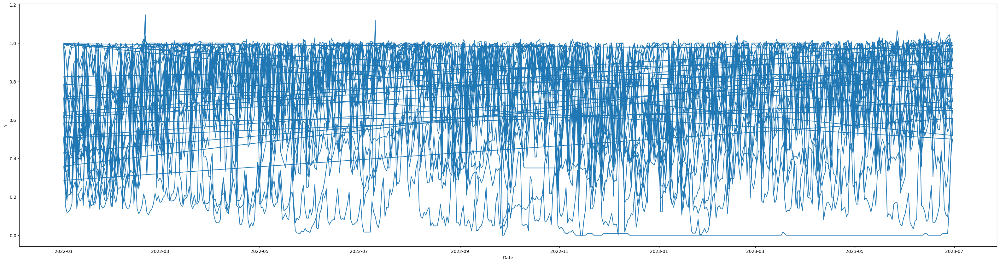

In [24]:
df['ds'] = pd.to_datetime(df['ds'])

plt.figure(figsize=(40,10))
plt.plot(df['ds'], df['y'])
plt.xlabel("Date")
plt.ylabel("y")
plt.show()

### StatsForecast

In [ ]:
sf = StatsForecast(
    models = [
        Naive(),
        SeasonalNaive(season_length=7),
        AutoETS(),
        AutoARIMA()],
    freq='D',
    n_jobs=-1       # use all cores
)

sf_cross_df = sf.cross_validation(
    df=df,
    h=28,
    n_windows=5,
    step_size=5
)

sf_cross_df.tail()

,unique_id,ds,cutoff,y,Naive,SeasonalNaive,AutoETS,AutoARIMA
2515,hotel_98,2023-06-26,2023-06-02,0.104839,0.16129,0.056452,0.161285,0.134696
2516,hotel_98,2023-06-27,2023-06-02,0.096774,0.16129,0.048387,0.161285,0.134696
2517,hotel_98,2023-06-28,2023-06-02,0.185484,0.16129,0.088710,0.161285,0.134696
2518,hotel_98,2023-06-29,2023-06-02,0.411290,0.16129,0.112903,0.161285,0.134696
2519,hotel_98,2023-06-30,2023-06-02,0.500000,0.16129,0.161290,0.161285,0.134696


### Neural Forecast

In [ ]:
# neural Network models
# note: use GPU otherwise this code will run for >2 hrs
nn_models = [
    AutoNBEATS(h=28),
    AutoNHITS(h=28),
]

nn = NeuralForecast(
    models = nn_models,
    freq = 'D')

nn_cross_df = nn.cross_validation(
    h = 28,
    df = df,
    n_windows = 5,
    step_size = 5) # no overlapping of windows

nn_cross_df

2025-12-05 17:16:34,575	INFO worker.py:2023 -- Started a local Ray instance.
/usr/local/lib/python3.12/dist-packages/ray/_private/worker.py:2062: FutureWarning: Tip: In future versions of Ray, Ray will no longer override accelerator visible devices env var if num_gpus=0 or num_gpus=None (default). To enable this behavior and turn off this error message, set RAY_ACCEL_ENV_VAR_OVERRIDE_ON_ZERO=0
  warnings.warn(
2025-12-05 17:16:38,888	INFO tune.py:253 -- Initializing Ray automatically. For cluster usage or custom Ray initialization, call `ray.init(...)` before `Tuner(...)`.


+--------------------------------------------------------------------+
| Configuration for experiment     _train_tune_2025-12-05_17-16-31   |
+--------------------------------------------------------------------+
| Search algorithm                 BasicVariantGenerator             |
| Scheduler                        FIFOScheduler                     |
| Number of trials                 10                                |
+--------------------------------------------------------------------+

View detailed results here: /root/ray_results/_train_tune_2025-12-05_17-16-31
To visualize your results with TensorBoard, run: `tensorboard --logdir /tmp/ray/session_2025-12-05_17-16-31_021217_1224/artifacts/2025-12-05_17-16-38/_train_tune_2025-12-05_17-16-31/driver_artifacts`


(_train_tune pid=4741) /usr/local/lib/python3.12/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=4741) Seed set to 16
(_train_tune pid=4741) GPU available: True (cuda), used: True
(_train_tune pid=4741) TPU available: False, using: 0 TPU cores
(_train_tune pid=4741) /usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Triggered

(_train_tune pid=4741) ┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
(_train_tune pid=4741) ┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
(_train_tune pid=4741) ┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
(_train_tune pid=4741) │ 0 │ loss         │ MAE           │      0 │ train │     0 │
(_train_tune pid=4741) │ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
(_train_tune pid=4741) │ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
(_train_tune pid=4741) │ 3 │ blocks       │ ModuleList    │  2.7 M │ train │     0 │
(_train_tune pid=4741) └───┴──────────────┴───────────────┴────────┴───────┴───────┘
(_train_tune pid=4741) Trainable params: 2.7 M                                                         
(_train_tune pid=4741) Non-trainable params: 9.6 K                                                     
(_train_tune pid=4741) Total params: 2.7 M                                                             
(_train_

(_train_tune pid=4741) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(pid=gcs_server) [2025-12-05 17:17:01,271 E 3911 3911] (gcs_server) gcs_server.cc:303: Failed to establish connection to the event+metrics exporter agent. Events and metrics will not be exported. Exporter agent status: RpcError: Running out of retries to initialize the metrics agent. rpc_code: 14
(raylet) [2025-12-05 17:17:04,513 E 4045 4045] (raylet) main.cc:979: Failed to establish connection to the metrics exporter agent. Metrics will not be exported. Exporter agent status: RpcError: Running out of retries to initialize the metrics agent. rpc_code: 14
(bundle_reservation_check_func pid=4103) [2025-12-05 17:17:08,123 E 4103 4187] core_worker_process.cc:837: Failed to establish connection to the metrics exporter agent. Metrics will not be exported. Exporter agent status: RpcError: Running out of retries to initialize the metrics agent. rpc_code: 14
(_train_tune pid=4741) [2025-12-05 17:17:15,429 E 4741 4806] core_worker_

(_train_tune pid=4741) Epoch 999/-2 ━━━━━━━━━━━━━━━━━ 1/1 0:00:00 • 0:00:00 0.00it/s v_num: 0.000      
(_train_tune pid=4741)                                                               train_loss_step:  
(_train_tune pid=4741)                                                               0.500             
(_train_tune pid=4741)                                                               train_loss_epoch: 
(_train_tune pid=4741)                                                               0.500 valid_loss: 
(_train_tune pid=4741)                                                               0.119             


(_train_tune pid=4741) `Trainer.fit` stopped: `max_steps=1000` reached.
(_train_tune pid=4965) /usr/local/lib/python3.12/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=4965) Seed set to 8
(_train_tune pid=4965) GPU available: True (cuda), used: True
(_train_tune pid=4965) TPU available: False, using: 0 TPU cores
(_train_tune pid=4965) /usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/not

(_train_tune pid=4965) ┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
(_train_tune pid=4965) ┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
(_train_tune pid=4965) ┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
(_train_tune pid=4965) │ 0 │ loss         │ MAE           │      0 │ train │     0 │
(_train_tune pid=4965) │ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
(_train_tune pid=4965) │ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
(_train_tune pid=4965) │ 3 │ blocks       │ ModuleList    │  2.7 M │ train │     0 │
(_train_tune pid=4965) └───┴──────────────┴───────────────┴────────┴───────┴───────┘
(_train_tune pid=4965) Trainable params: 2.7 M                                                         
(_train_tune pid=4965) Non-trainable params: 8.0 K                                                     
(_train_tune pid=4965) Total params: 2.7 M                                                             
(_train_

(_train_tune pid=4965) `Trainer.fit` stopped: `max_steps=500` reached.


(_train_tune pid=4965) Epoch 499/-2 ━━━━━━━━━━━━━━━━━ 1/1 0:00:00 • 0:00:00 0.00it/s v_num: 0.000      
(_train_tune pid=4965)                                                               train_loss_step:  
(_train_tune pid=4965)                                                               0.005             
(_train_tune pid=4965)                                                               train_loss_epoch: 
(_train_tune pid=4965)                                                               0.005 valid_loss: 
(_train_tune pid=4965)                                                               0.149             


(_train_tune pid=5135) /usr/local/lib/python3.12/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=5135) Seed set to 16
(_train_tune pid=5135) GPU available: True (cuda), used: True
(_train_tune pid=5135) TPU available: False, using: 0 TPU cores
(_train_tune pid=5135) /usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Triggered

(_train_tune pid=5135) ┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
(_train_tune pid=5135) ┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
(_train_tune pid=5135) ┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
(_train_tune pid=5135) │ 0 │ loss         │ MAE           │      0 │ train │     0 │
(_train_tune pid=5135) │ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
(_train_tune pid=5135) │ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
(_train_tune pid=5135) │ 3 │ blocks       │ ModuleList    │  2.6 M │ train │     0 │
(_train_tune pid=5135) └───┴──────────────┴───────────────┴────────┴───────┴───────┘
(_train_tune pid=5135) Trainable params: 2.6 M                                                         
(_train_tune pid=5135) Non-trainable params: 4.8 K                                                     
(_train_tune pid=5135) Total params: 2.6 M                                                             
(_train_

(_train_tune pid=5135) `Trainer.fit` stopped: `max_steps=1000` reached.


(_train_tune pid=5135) Epoch 999/-2 ━━━━━━━━━━━━━━━━━ 1/1 0:00:00 • 0:00:00 0.00it/s v_num: 0.000      
(_train_tune pid=5135)                                                               train_loss_step:  
(_train_tune pid=5135)                                                               0.588             
(_train_tune pid=5135)                                                               train_loss_epoch: 
(_train_tune pid=5135)                                                               0.588 valid_loss: 
(_train_tune pid=5135)                                                               0.110             


(_train_tune pid=5339) /usr/local/lib/python3.12/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=5339) Seed set to 3
(_train_tune pid=5339) GPU available: True (cuda), used: True
(_train_tune pid=5339) TPU available: False, using: 0 TPU cores
(_train_tune pid=5339) /usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Triggered 

(_train_tune pid=5339) ┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
(_train_tune pid=5339) ┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
(_train_tune pid=5339) ┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
(_train_tune pid=5339) │ 0 │ loss         │ MAE           │      0 │ train │     0 │
(_train_tune pid=5339) │ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
(_train_tune pid=5339) │ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
(_train_tune pid=5339) │ 3 │ blocks       │ ModuleList    │  2.6 M │ train │     0 │
(_train_tune pid=5339) └───┴──────────────┴───────────────┴────────┴───────┴───────┘
(_train_tune pid=5339) Trainable params: 2.6 M                                                         
(_train_tune pid=5339) Non-trainable params: 4.8 K                                                     
(_train_tune pid=5339) Total params: 2.6 M                                                             
(_train_

(_train_tune pid=5339) `Trainer.fit` stopped: `max_steps=500` reached.


(_train_tune pid=5339) Epoch 499/-2 ━━━━━━━━━━━━━━━━━ 1/1 0:00:00 • 0:00:00 0.00it/s v_num: 0.000      
(_train_tune pid=5339)                                                               train_loss_step:  
(_train_tune pid=5339)                                                               0.304             
(_train_tune pid=5339)                                                               train_loss_epoch: 
(_train_tune pid=5339)                                                               0.304 valid_loss: 
(_train_tune pid=5339)                                                               0.123             


(_train_tune pid=5504) /usr/local/lib/python3.12/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=5504) Seed set to 2
(_train_tune pid=5504) GPU available: True (cuda), used: True
(_train_tune pid=5504) TPU available: False, using: 0 TPU cores
(_train_tune pid=5504) /usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Triggered 

(_train_tune pid=5504) ┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
(_train_tune pid=5504) ┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
(_train_tune pid=5504) ┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
(_train_tune pid=5504) │ 0 │ loss         │ MAE           │      0 │ train │     0 │
(_train_tune pid=5504) │ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
(_train_tune pid=5504) │ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
(_train_tune pid=5504) │ 3 │ blocks       │ ModuleList    │  2.6 M │ train │     0 │
(_train_tune pid=5504) └───┴──────────────┴───────────────┴────────┴───────┴───────┘
(_train_tune pid=5504) Trainable params: 2.6 M                                                         
(_train_tune pid=5504) Non-trainable params: 4.8 K                                                     
(_train_tune pid=5504) Total params: 2.6 M                                                             
(_train_

(_train_tune pid=5504) `Trainer.fit` stopped: `max_steps=500` reached.


(_train_tune pid=5504) Epoch 499/-2 ━━━━━━━━━━━━━━━━━ 1/1 0:00:00 • 0:00:00 0.00it/s v_num: 0.000      
(_train_tune pid=5504)                                                               train_loss_step:  
(_train_tune pid=5504)                                                               1.046             
(_train_tune pid=5504)                                                               train_loss_epoch: 
(_train_tune pid=5504)                                                               1.046 valid_loss: 
(_train_tune pid=5504)                                                               0.108             


(_train_tune pid=5682) /usr/local/lib/python3.12/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=5682) Seed set to 14
(_train_tune pid=5682) GPU available: True (cuda), used: True
(_train_tune pid=5682) TPU available: False, using: 0 TPU cores
(_train_tune pid=5682) /usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Triggered

(_train_tune pid=5682) ┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
(_train_tune pid=5682) ┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
(_train_tune pid=5682) ┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
(_train_tune pid=5682) │ 0 │ loss         │ MAE           │      0 │ train │     0 │
(_train_tune pid=5682) │ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
(_train_tune pid=5682) │ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
(_train_tune pid=5682) │ 3 │ blocks       │ ModuleList    │  2.6 M │ train │     0 │
(_train_tune pid=5682) └───┴──────────────┴───────────────┴────────┴───────┴───────┘
(_train_tune pid=5682) Trainable params: 2.6 M                                                         
(_train_tune pid=5682) Non-trainable params: 4.8 K                                                     
(_train_tune pid=5682) Total params: 2.6 M                                                             
(_train_

(_train_tune pid=5682) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(_train_tune pid=5682) `Trainer.fit` stopped: `max_steps=1000` reached.


(_train_tune pid=5682) Epoch 999/-2 ━━━━━━━━━━━━━━━━━ 1/1 0:00:00 • 0:00:00 0.00it/s v_num: 0.000      
(_train_tune pid=5682)                                                               train_loss_step:  
(_train_tune pid=5682)                                                               48135.039         
(_train_tune pid=5682)                                                               train_loss_epoch: 
(_train_tune pid=5682)                                                               48135.039         
(_train_tune pid=5682)                                                               valid_loss:       
(_train_tune pid=5682)                                                               2536.056          


(_train_tune pid=5887) /usr/local/lib/python3.12/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=5887) Seed set to 9
(_train_tune pid=5887) GPU available: True (cuda), used: True
(_train_tune pid=5887) TPU available: False, using: 0 TPU cores
(_train_tune pid=5887) /usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Triggered 

(_train_tune pid=5887) ┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
(_train_tune pid=5887) ┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
(_train_tune pid=5887) ┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
(_train_tune pid=5887) │ 0 │ loss         │ MAE           │      0 │ train │     0 │
(_train_tune pid=5887) │ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
(_train_tune pid=5887) │ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
(_train_tune pid=5887) │ 3 │ blocks       │ ModuleList    │  2.6 M │ train │     0 │
(_train_tune pid=5887) └───┴──────────────┴───────────────┴────────┴───────┴───────┘
(_train_tune pid=5887) Trainable params: 2.6 M                                                         
(_train_tune pid=5887) Non-trainable params: 6.4 K                                                     
(_train_tune pid=5887) Total params: 2.6 M                                                             
(_train_

(_train_tune pid=5887) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


(_train_tune pid=5887) Epoch 499/-2 ━━━━━━━━━━━━━━━━━ 1/1 0:00:00 • 0:00:00 0.00it/s v_num: 0.000      
(_train_tune pid=5887)                                                               train_loss_step:  
(_train_tune pid=5887)                                                               0.272             
(_train_tune pid=5887)                                                               train_loss_epoch: 
(_train_tune pid=5887)                                                               0.272 valid_loss: 
(_train_tune pid=5887)                                                               0.132             


(_train_tune pid=5887) `Trainer.fit` stopped: `max_steps=500` reached.
(_train_tune pid=6062) /usr/local/lib/python3.12/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=6062) Seed set to 12
(_train_tune pid=6062) GPU available: True (cuda), used: True
(_train_tune pid=6062) TPU available: False, using: 0 TPU cores
(_train_tune pid=6062) /usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/not

(_train_tune pid=6062) ┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
(_train_tune pid=6062) ┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
(_train_tune pid=6062) ┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
(_train_tune pid=6062) │ 0 │ loss         │ MAE           │      0 │ train │     0 │
(_train_tune pid=6062) │ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
(_train_tune pid=6062) │ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
(_train_tune pid=6062) │ 3 │ blocks       │ ModuleList    │  2.7 M │ train │     0 │
(_train_tune pid=6062) └───┴──────────────┴───────────────┴────────┴───────┴───────┘
(_train_tune pid=6062) Trainable params: 2.7 M                                                         
(_train_tune pid=6062) Non-trainable params: 8.0 K                                                     
(_train_tune pid=6062) Total params: 2.7 M                                                             
(_train_

(_train_tune pid=6062) `Trainer.fit` stopped: `max_steps=500` reached.
(_train_tune pid=6234) /usr/local/lib/python3.12/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=6234) Seed set to 7
(_train_tune pid=6234) GPU available: True (cuda), used: True
(_train_tune pid=6234) TPU available: False, using: 0 TPU cores
(_train_tune pid=6234) /usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/note

(_train_tune pid=6234) ┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
(_train_tune pid=6234) ┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
(_train_tune pid=6234) ┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
(_train_tune pid=6234) │ 0 │ loss         │ MAE           │      0 │ train │     0 │
(_train_tune pid=6234) │ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
(_train_tune pid=6234) │ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
(_train_tune pid=6234) │ 3 │ blocks       │ ModuleList    │  2.5 M │ train │     0 │
(_train_tune pid=6234) └───┴──────────────┴───────────────┴────────┴───────┴───────┘
(_train_tune pid=6234) Trainable params: 2.5 M                                                         
(_train_tune pid=6234) Non-trainable params: 3.2 K                                                     
(_train_tune pid=6234) Total params: 2.5 M                                                             
(_train_

(_train_tune pid=6234) `Trainer.fit` stopped: `max_steps=1000` reached.


(_train_tune pid=6234) Epoch 999/-2 ━━━━━━━━━━━━━━━━━ 1/1 0:00:00 • 0:00:00 0.00it/s v_num: 0.000      
(_train_tune pid=6234)                                                               train_loss_step:  
(_train_tune pid=6234)                                                               0.858             
(_train_tune pid=6234)                                                               train_loss_epoch: 
(_train_tune pid=6234)                                                               0.858 valid_loss: 
(_train_tune pid=6234)                                                               0.123             


(_train_tune pid=6432) /usr/local/lib/python3.12/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=6432) Seed set to 5
(_train_tune pid=6432) GPU available: True (cuda), used: True
(_train_tune pid=6432) TPU available: False, using: 0 TPU cores
(_train_tune pid=6432) /usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Triggered 

(_train_tune pid=6432) ┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
(_train_tune pid=6432) ┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
(_train_tune pid=6432) ┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
(_train_tune pid=6432) │ 0 │ loss         │ MAE           │      0 │ train │     0 │
(_train_tune pid=6432) │ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
(_train_tune pid=6432) │ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
(_train_tune pid=6432) │ 3 │ blocks       │ ModuleList    │  2.6 M │ train │     0 │
(_train_tune pid=6432) └───┴──────────────┴───────────────┴────────┴───────┴───────┘
(_train_tune pid=6432) Trainable params: 2.6 M                                                         
(_train_tune pid=6432) Non-trainable params: 4.8 K                                                     
(_train_tune pid=6432) Total params: 2.6 M                                                             
(_train_

(_train_tune pid=6432) `Trainer.fit` stopped: `max_steps=500` reached.
2025-12-05 17:21:35,361	INFO tune.py:1009 -- Wrote the latest version of all result files and experiment state to '/root/ray_results/_train_tune_2025-12-05_17-16-31' in 0.0060s.
INFO:lightning_fabric.utilities.seed:Seed set to 2
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
/usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices


(_train_tune pid=6432) Epoch 499/-2 ━━━━━━━━━━━━━━━━━ 1/1 0:00:00 • 0:00:00 0.00it/s v_num: 0.000      
(_train_tune pid=6432)                                                               train_loss_step:  
(_train_tune pid=6432)                                                               4.415             
(_train_tune pid=6432)                                                               train_loss_epoch: 
(_train_tune pid=6432)                                                               4.415 valid_loss: 
(_train_tune pid=6432)                                                               1.144             


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ eval  │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ blocks       │ ModuleList    │  2.6 M │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 2.6 M                                                                                            
Non-trainable params: 4.8 K                                                                                        
Total params: 2.6 M                                                                                                
Total estimated model params size (MB): 10                                                                         
Modules in train mode: 30                                                                                          
Modules in eval mode: 1                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=500` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

+--------------------------------------------------------------------+
| Configuration for experiment     _train_tune_2025-12-05_17-21-51   |
+--------------------------------------------------------------------+
| Search algorithm                 BasicVariantGenerator             |
| Scheduler                        FIFOScheduler                     |
| Number of trials                 10                                |
+--------------------------------------------------------------------+

View detailed results here: /root/ray_results/_train_tune_2025-12-05_17-21-51
To visualize your results with TensorBoard, run: `tensorboard --logdir /tmp/ray/session_2025-12-05_17-16-31_021217_1224/artifacts/2025-12-05_17-21-51/_train_tune_2025-12-05_17-21-51/driver_artifacts`


(_train_tune pid=6681) /usr/local/lib/python3.12/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=6681) Seed set to 6
(_train_tune pid=6681) GPU available: True (cuda), used: True
(_train_tune pid=6681) TPU available: False, using: 0 TPU cores
(_train_tune pid=6681) /usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Triggered 

(_train_tune pid=6681) ┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
(_train_tune pid=6681) ┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
(_train_tune pid=6681) ┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
(_train_tune pid=6681) │ 0 │ loss         │ MAE           │      0 │ train │     0 │
(_train_tune pid=6681) │ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
(_train_tune pid=6681) │ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
(_train_tune pid=6681) │ 3 │ blocks       │ ModuleList    │  2.7 M │ train │     0 │
(_train_tune pid=6681) └───┴──────────────┴───────────────┴────────┴───────┴───────┘
(_train_tune pid=6681) Trainable params: 2.7 M                                                         
(_train_tune pid=6681) Non-trainable params: 0                                                         
(_train_tune pid=6681) Total params: 2.7 M                                                             
(_train_

(_train_tune pid=6681) [2025-12-05 17:22:25,753 E 6681 6729] core_worker_process.cc:837: Failed to establish connection to the metrics exporter agent. Metrics will not be exported. Exporter agent status: RpcError: Running out of retries to initialize the metrics agent. rpc_code: 14
(_train_tune pid=6681) `Trainer.fit` stopped: `max_steps=1400.0` reached.


(_train_tune pid=6681) Epoch 1399/-2 ━━━━━━━━━━━━━━━━━ 1/1 0:00:00 • 0:00:00 0.00it/s v_num: 0.000     
(_train_tune pid=6681)                                                                train_loss_step: 
(_train_tune pid=6681)                                                                6940889.000      
(_train_tune pid=6681)                                                                train_loss_epoch:
(_train_tune pid=6681)                                                                6940889.000      
(_train_tune pid=6681)                                                                valid_loss:      
(_train_tune pid=6681)                                                                13316787.000     


(_train_tune pid=6900) /usr/local/lib/python3.12/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=6900) Seed set to 15
(_train_tune pid=6900) GPU available: True (cuda), used: True
(_train_tune pid=6900) TPU available: False, using: 0 TPU cores
(_train_tune pid=6900) /usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Triggered

(_train_tune pid=6900) ┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
(_train_tune pid=6900) ┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
(_train_tune pid=6900) ┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
(_train_tune pid=6900) │ 0 │ loss         │ MAE           │      0 │ train │     0 │
(_train_tune pid=6900) │ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
(_train_tune pid=6900) │ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
(_train_tune pid=6900) │ 3 │ blocks       │ ModuleList    │  2.8 M │ train │     0 │
(_train_tune pid=6900) └───┴──────────────┴───────────────┴────────┴───────┴───────┘
(_train_tune pid=6900) Trainable params: 2.8 M                                                         
(_train_tune pid=6900) Non-trainable params: 0                                                         
(_train_tune pid=6900) Total params: 2.8 M                                                             
(_train_

(_train_tune pid=6900) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


(_train_tune pid=6900) Epoch 499/-2 ━━━━━━━━━━━━━━━━━ 1/1 0:00:00 • 0:00:00 0.00it/s v_num: 0.000      
(_train_tune pid=6900)                                                               train_loss_step:  
(_train_tune pid=6900)                                                               0.020             
(_train_tune pid=6900)                                                               train_loss_epoch: 
(_train_tune pid=6900)                                                               0.020 valid_loss: 
(_train_tune pid=6900)                                                               0.130             


(_train_tune pid=6900) `Trainer.fit` stopped: `max_steps=500.0` reached.
(_train_tune pid=7078) /usr/local/lib/python3.12/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=7078) Seed set to 3
(_train_tune pid=7078) GPU available: True (cuda), used: True
(_train_tune pid=7078) TPU available: False, using: 0 TPU cores
(_train_tune pid=7078) /usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/no

(_train_tune pid=7078) ┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
(_train_tune pid=7078) ┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
(_train_tune pid=7078) ┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
(_train_tune pid=7078) │ 0 │ loss         │ MAE           │      0 │ train │     0 │
(_train_tune pid=7078) │ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
(_train_tune pid=7078) │ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
(_train_tune pid=7078) │ 3 │ blocks       │ ModuleList    │  2.5 M │ train │     0 │
(_train_tune pid=7078) └───┴──────────────┴───────────────┴────────┴───────┴───────┘
(_train_tune pid=7078) Trainable params: 2.5 M                                                         
(_train_tune pid=7078) Non-trainable params: 0                                                         
(_train_tune pid=7078) Total params: 2.5 M                                                             
(_train_

(_train_tune pid=7078) `Trainer.fit` stopped: `max_steps=1000.0` reached.


(_train_tune pid=7078) Epoch 999/-2 ━━━━━━━━━━━━━━━━━ 1/1 0:00:00 • 0:00:00 0.00it/s v_num: 0.000      
(_train_tune pid=7078)                                                               train_loss_step:  
(_train_tune pid=7078)                                                               0.141             
(_train_tune pid=7078)                                                               train_loss_epoch: 
(_train_tune pid=7078)                                                               0.141 valid_loss: 
(_train_tune pid=7078)                                                               0.121             


(_train_tune pid=7284) /usr/local/lib/python3.12/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=7284) Seed set to 10
(_train_tune pid=7284) GPU available: True (cuda), used: True
(_train_tune pid=7284) TPU available: False, using: 0 TPU cores
(_train_tune pid=7284) /usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Triggered

(_train_tune pid=7284) ┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
(_train_tune pid=7284) ┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
(_train_tune pid=7284) ┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
(_train_tune pid=7284) │ 0 │ loss         │ MAE           │      0 │ train │     0 │
(_train_tune pid=7284) │ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
(_train_tune pid=7284) │ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
(_train_tune pid=7284) │ 3 │ blocks       │ ModuleList    │  2.4 M │ train │     0 │
(_train_tune pid=7284) └───┴──────────────┴───────────────┴────────┴───────┴───────┘
(_train_tune pid=7284) Trainable params: 2.4 M                                                         
(_train_tune pid=7284) Non-trainable params: 0                                                         
(_train_tune pid=7284) Total params: 2.4 M                                                             
(_train_

(_train_tune pid=7284) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(_train_tune pid=7284) `Trainer.fit` stopped: `max_steps=800.0` reached.


(_train_tune pid=7284) Epoch 799/-2 ━━━━━━━━━━━━━━━━━ 1/1 0:00:00 • 0:00:00 0.00it/s v_num: 0.000      
(_train_tune pid=7284)                                                               train_loss_step:  
(_train_tune pid=7284)                                                               0.028             
(_train_tune pid=7284)                                                               train_loss_epoch: 
(_train_tune pid=7284)                                                               0.028 valid_loss: 
(_train_tune pid=7284)                                                               0.125             


(_train_tune pid=7474) /usr/local/lib/python3.12/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=7474) Seed set to 4
(_train_tune pid=7474) GPU available: True (cuda), used: True
(_train_tune pid=7474) TPU available: False, using: 0 TPU cores
(_train_tune pid=7474) /usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Triggered 

(_train_tune pid=7474) ┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
(_train_tune pid=7474) ┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
(_train_tune pid=7474) ┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
(_train_tune pid=7474) │ 0 │ loss         │ MAE           │      0 │ train │     0 │
(_train_tune pid=7474) │ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
(_train_tune pid=7474) │ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
(_train_tune pid=7474) │ 3 │ blocks       │ ModuleList    │  2.5 M │ train │     0 │
(_train_tune pid=7474) └───┴──────────────┴───────────────┴────────┴───────┴───────┘
(_train_tune pid=7474) Trainable params: 2.5 M                                                         
(_train_tune pid=7474) Non-trainable params: 0                                                         
(_train_tune pid=7474) Total params: 2.5 M                                                             
(_train_

(_train_tune pid=7474) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


(_train_tune pid=7474) Epoch 799/-2 ━━━━━━━━━━━━━━━━━ 1/1 0:00:00 • 0:00:00 0.00it/s v_num: 0.000      
(_train_tune pid=7474)                                                               train_loss_step:  
(_train_tune pid=7474)                                                               0.121             
(_train_tune pid=7474)                                                               train_loss_epoch: 
(_train_tune pid=7474)                                                               0.121 valid_loss: 
(_train_tune pid=7474)                                                               0.130             


(_train_tune pid=7474) `Trainer.fit` stopped: `max_steps=800.0` reached.
(_train_tune pid=7664) /usr/local/lib/python3.12/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=7664) Seed set to 12
(_train_tune pid=7664) GPU available: True (cuda), used: True
(_train_tune pid=7664) TPU available: False, using: 0 TPU cores
(_train_tune pid=7664) /usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/n

(_train_tune pid=7664) ┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
(_train_tune pid=7664) ┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
(_train_tune pid=7664) ┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
(_train_tune pid=7664) │ 0 │ loss         │ MAE           │      0 │ train │     0 │
(_train_tune pid=7664) │ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
(_train_tune pid=7664) │ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
(_train_tune pid=7664) │ 3 │ blocks       │ ModuleList    │  2.6 M │ train │     0 │
(_train_tune pid=7664) └───┴──────────────┴───────────────┴────────┴───────┴───────┘
(_train_tune pid=7664) Trainable params: 2.6 M                                                         
(_train_tune pid=7664) Non-trainable params: 0                                                         
(_train_tune pid=7664) Total params: 2.6 M                                                             
(_train_

(_train_tune pid=7664) [2025-12-05 17:25:03,861 E 7664 7712] core_worker_process.cc:837: Failed to establish connection to the metrics exporter agent. Metrics will not be exported. Exporter agent status: RpcError: Running out of retries to initialize the metrics agent. rpc_code: 14
(_train_tune pid=7664) `Trainer.fit` stopped: `max_steps=1300.0` reached.


(_train_tune pid=7664) Epoch 1299/-2 ━━━━━━━━━━━━━━━━━ 1/1 0:00:00 • 0:00:00 0.00it/s v_num: 0.000     
(_train_tune pid=7664)                                                                train_loss_step: 
(_train_tune pid=7664)                                                                0.046            
(_train_tune pid=7664)                                                                train_loss_epoch:
(_train_tune pid=7664)                                                                0.046 valid_loss:
(_train_tune pid=7664)                                                                0.140            


(_train_tune pid=7885) /usr/local/lib/python3.12/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=7885) Seed set to 13
(_train_tune pid=7885) GPU available: True (cuda), used: True
(_train_tune pid=7885) TPU available: False, using: 0 TPU cores
(_train_tune pid=7885) /usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Triggered

(_train_tune pid=7885) ┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
(_train_tune pid=7885) ┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
(_train_tune pid=7885) ┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
(_train_tune pid=7885) │ 0 │ loss         │ MAE           │      0 │ train │     0 │
(_train_tune pid=7885) │ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
(_train_tune pid=7885) │ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
(_train_tune pid=7885) │ 3 │ blocks       │ ModuleList    │  2.6 M │ train │     0 │
(_train_tune pid=7885) └───┴──────────────┴───────────────┴────────┴───────┴───────┘
(_train_tune pid=7885) Trainable params: 2.6 M                                                         
(_train_tune pid=7885) Non-trainable params: 0                                                         
(_train_tune pid=7885) Total params: 2.6 M                                                             
(_train_

(_train_tune pid=7885) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


(_train_tune pid=7885) Epoch 599/-2 ━━━━━━━━━━━━━━━━━ 1/1 0:00:00 • 0:00:00 0.00it/s v_num: 0.000      
(_train_tune pid=7885)                                                               train_loss_step:  
(_train_tune pid=7885)                                                               0.020             
(_train_tune pid=7885)                                                               train_loss_epoch: 
(_train_tune pid=7885)                                                               0.020 valid_loss: 
(_train_tune pid=7885)                                                               0.123             


(_train_tune pid=7885) `Trainer.fit` stopped: `max_steps=600.0` reached.
(_train_tune pid=8063) /usr/local/lib/python3.12/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=8063) Seed set to 10
(_train_tune pid=8063) GPU available: True (cuda), used: True
(_train_tune pid=8063) TPU available: False, using: 0 TPU cores
(_train_tune pid=8063) /usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/n

(_train_tune pid=8063) ┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
(_train_tune pid=8063) ┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
(_train_tune pid=8063) ┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
(_train_tune pid=8063) │ 0 │ loss         │ MAE           │      0 │ train │     0 │
(_train_tune pid=8063) │ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
(_train_tune pid=8063) │ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
(_train_tune pid=8063) │ 3 │ blocks       │ ModuleList    │  2.8 M │ train │     0 │
(_train_tune pid=8063) └───┴──────────────┴───────────────┴────────┴───────┴───────┘
(_train_tune pid=8063) Trainable params: 2.8 M                                                         
(_train_tune pid=8063) Non-trainable params: 0                                                         
(_train_tune pid=8063) Total params: 2.8 M                                                             
(_train_

(_train_tune pid=8063) `Trainer.fit` stopped: `max_steps=1000.0` reached.


(_train_tune pid=8063) Epoch 999/-2 ━━━━━━━━━━━━━━━━━ 1/1 0:00:00 • 0:00:00 0.00it/s v_num: 0.000      
(_train_tune pid=8063)                                                               train_loss_step:  
(_train_tune pid=8063)                                                               0.022             
(_train_tune pid=8063)                                                               train_loss_epoch: 
(_train_tune pid=8063)                                                               0.022 valid_loss: 
(_train_tune pid=8063)                                                               0.135             


(_train_tune pid=8261) /usr/local/lib/python3.12/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=8261) Seed set to 4
(_train_tune pid=8261) GPU available: True (cuda), used: True
(_train_tune pid=8261) TPU available: False, using: 0 TPU cores
(_train_tune pid=8261) /usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Triggered 

(_train_tune pid=8261) ┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
(_train_tune pid=8261) ┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
(_train_tune pid=8261) ┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
(_train_tune pid=8261) │ 0 │ loss         │ MAE           │      0 │ train │     0 │
(_train_tune pid=8261) │ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
(_train_tune pid=8261) │ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
(_train_tune pid=8261) │ 3 │ blocks       │ ModuleList    │  2.6 M │ train │     0 │
(_train_tune pid=8261) └───┴──────────────┴───────────────┴────────┴───────┴───────┘
(_train_tune pid=8261) Trainable params: 2.6 M                                                         
(_train_tune pid=8261) Non-trainable params: 0                                                         
(_train_tune pid=8261) Total params: 2.6 M                                                             
(_train_

(_train_tune pid=8261) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(_train_tune pid=8261) [2025-12-05 17:26:43,829 E 8261 8309] core_worker_process.cc:837: Failed to establish connection to the metrics exporter agent. Metrics will not be exported. Exporter agent status: RpcError: Running out of retries to initialize the metrics agent. rpc_code: 14


(_train_tune pid=8261) Epoch 1299/-2 ━━━━━━━━━━━━━━━━━ 1/1 0:00:00 • 0:00:00 0.00it/s v_num: 0.000     
(_train_tune pid=8261)                                                                train_loss_step: 
(_train_tune pid=8261)                                                                4.427            
(_train_tune pid=8261)                                                                train_loss_epoch:
(_train_tune pid=8261)                                                                4.427 valid_loss:
(_train_tune pid=8261)                                                                4.053            


(_train_tune pid=8261) `Trainer.fit` stopped: `max_steps=1300.0` reached.
(_train_tune pid=8484) /usr/local/lib/python3.12/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=8484) Seed set to 17
(_train_tune pid=8484) GPU available: True (cuda), used: True
(_train_tune pid=8484) TPU available: False, using: 0 TPU cores
(_train_tune pid=8484) /usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/

(_train_tune pid=8484) ┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
(_train_tune pid=8484) ┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
(_train_tune pid=8484) ┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
(_train_tune pid=8484) │ 0 │ loss         │ MAE           │      0 │ train │     0 │
(_train_tune pid=8484) │ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
(_train_tune pid=8484) │ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
(_train_tune pid=8484) │ 3 │ blocks       │ ModuleList    │  2.5 M │ train │     0 │
(_train_tune pid=8484) └───┴──────────────┴───────────────┴────────┴───────┴───────┘
(_train_tune pid=8484) Trainable params: 2.5 M                                                         
(_train_tune pid=8484) Non-trainable params: 0                                                         
(_train_tune pid=8484) Total params: 2.5 M                                                             
(_train_

(_train_tune pid=8484) [2025-12-05 17:27:21,890 E 8484 8533] core_worker_process.cc:837: Failed to establish connection to the metrics exporter agent. Metrics will not be exported. Exporter agent status: RpcError: Running out of retries to initialize the metrics agent. rpc_code: 14
2025-12-05 17:27:26,888	INFO tune.py:1009 -- Wrote the latest version of all result files and experiment state to '/root/ray_results/_train_tune_2025-12-05_17-21-51' in 0.0064s.
INFO:lightning_fabric.utilities.seed:Seed set to 17
(_train_tune pid=8484) `Trainer.fit` stopped: `max_steps=1400.0` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



(_train_tune pid=8484) Epoch 1399/-2 ━━━━━━━━━━━━━━━━━ 1/1 0:00:00 • 0:00:00 0.00it/s v_num: 0.000     
(_train_tune pid=8484)                                                                train_loss_step: 
(_train_tune pid=8484)                                                                0.088            
(_train_tune pid=8484)                                                                train_loss_epoch:
(_train_tune pid=8484)                                                                0.088 valid_loss:
(_train_tune pid=8484)                                                                0.116            


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ eval  │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ blocks       │ ModuleList    │  2.5 M │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 2.5 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 2.5 M                                                                                                
Total estimated model params size (MB): 10                                                                         
Modules in train mode: 33                                                                                          
Modules in eval mode: 1                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1400.0` reached.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

,unique_id,ds,cutoff,AutoNBEATS,AutoNHITS,y
0,hotel_0,2023-05-14,2023-05-13,0.635457,0.568607,0.432099
1,hotel_0,2023-05-15,2023-05-13,0.665983,0.558425,0.580247
2,hotel_0,2023-05-16,2023-05-13,0.665652,0.615219,0.703704
3,hotel_0,2023-05-17,2023-05-13,0.697082,0.612136,0.691358
4,hotel_0,2023-05-18,2023-05-13,0.751321,0.646510,0.765432
...,...,...,...,...,...,...
2515,hotel_98,2023-06-26,2023-06-02,0.037565,0.304491,0.104839
2516,hotel_98,2023-06-27,2023-06-02,0.079113,0.283737,0.096774
2517,hotel_98,2023-06-28,2023-06-02,0.120195,0.287006,0.185484
2518,hotel_98,2023-06-29,2023-06-02,0.281699,0.334838,0.411290


## TimeGPT

In [72]:
import os
from dotenv import load_dotenv, find_dotenv

load_dotenv(find_dotenv())

APIKEY = os.getenv("NIXTLA_APIKEY")
nixtla_client = NixtlaClient(api_key = APIKEY)

In [ ]:
nixtla_client.validate_api_key()

True

In [ ]:
timegpt_cross_df = nixtla_client.cross_validation(
    h = 28,
    df = df,
    n_windows = 5,
    step_size = 5,
    freq = "D")

timegpt_cross_df

,unique_id,ds,cutoff,y,TimeGPT
0,hotel_0,2023-05-14,2023-05-13,0.432099,0.631918
1,hotel_0,2023-05-15,2023-05-13,0.580247,0.626163
2,hotel_0,2023-05-16,2023-05-13,0.703704,0.781002
3,hotel_0,2023-05-17,2023-05-13,0.691358,0.795689
4,hotel_0,2023-05-18,2023-05-13,0.765432,0.810019
...,...,...,...,...,...
2515,hotel_98,2023-06-26,2023-06-02,0.104839,0.118759
2516,hotel_98,2023-06-27,2023-06-02,0.096774,0.113934
2517,hotel_98,2023-06-28,2023-06-02,0.185484,0.118138
2518,hotel_98,2023-06-29,2023-06-02,0.411290,0.136157


### MLForecast

In [ ]:
## Includes code from ChatGPT
from mlforecast import MLForecast
import xgboost as xgb

# Make sure modified_df has at least: ['unique_id', 'ds', 'y'] plus your extra features
modified_df = pd.read_parquet("sample_hotels.parquet").copy()
modified_df['ds'] = pd.to_datetime(modified_df['ds'])

# Example of encoding your features (adjust to match your notebook):
modified_df['day'] = modified_df['day'].astype('category').cat.codes
modified_df['month'] = modified_df['month'].astype('category').cat.codes

ml_model = xgb.XGBRegressor(
    enable_categorical=True,
    n_estimators=200,
    max_depth=6,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)

mlf = MLForecast(
    models=ml_model,
    freq='D',
    lags=range(28, 56),       # same as you used before
    lag_transforms={          # put your existing lag_transforms here
        # 28: [mean],  # example
        # 29: [max],
    },
    date_features=[]          # or ['dayofweek', 'month'] if you want
)

mlf_cross_df = mlf.cross_validation(
    df=modified_df,
    h=28,
    n_windows=5,
    step_size=5,
    static_features=[]        # or list of static columns if you have them
)

display(mlf_cross_df.head())


,unique_id,ds,cutoff,y,XGBRegressor
0,hotel_0,2023-05-14,2023-05-13,0.432099,0.497768
1,hotel_0,2023-05-15,2023-05-13,0.580247,0.535286
2,hotel_0,2023-05-16,2023-05-13,0.703704,0.692400
3,hotel_0,2023-05-17,2023-05-13,0.691358,0.795190
4,hotel_0,2023-05-18,2023-05-13,0.765432,0.732400


## 5-fold time-series cross-validation (non-overlapping)

In [25]:
## Combining all four cross validation dfs
mlf_clean = mlf_cross_df.drop(columns=["cutoff", "fold"], errors="ignore")
nn_clean = nn_cross_df.drop(columns=["cutoff", "y"], errors="ignore")
timegpt_clean = timegpt_cross_df.drop(columns=["cutoff", "y"], errors="ignore")

combined_df = (
    sf_cross_df.merge(nn_clean, on=["unique_id", "ds"], how="right")
               .merge(mlf_clean, on=["unique_id", "ds"], how="right")
               .merge(timegpt_clean, on=["unique_id", "ds"], how="right")
).assign(
    y = lambda x: x["y_x"]
)

combo_df = combined_df[['unique_id', 'ds', 'y', 'Naive', 'SeasonalNaive', 'AutoETS', 'AutoARIMA',
             'AutoNBEATS', 'AutoNHITS', 'XGBRegressor', 'TimeGPT']]

In [61]:
display(combo_df)

,unique_id,ds,y,Naive,SeasonalNaive,AutoETS,AutoARIMA,AutoNBEATS,AutoNHITS,XGBRegressor,TimeGPT
0,hotel_0,2023-05-14,0.432099,0.987654,0.604938,0.928975,0.877428,0.635457,0.568607,0.497768,0.631918
1,hotel_0,2023-05-15,0.580247,0.987654,0.493827,0.928975,0.807290,0.665983,0.558425,0.535286,0.626163
2,hotel_0,2023-05-16,0.703704,0.987654,0.666667,0.928975,0.784275,0.665652,0.615219,0.692400,0.781002
3,hotel_0,2023-05-17,0.691358,0.987654,0.629630,0.928975,0.784275,0.697082,0.612136,0.795190,0.795689
4,hotel_0,2023-05-18,0.765432,0.987654,0.827160,0.928975,0.784275,0.751321,0.646510,0.732400,0.810019
...,...,...,...,...,...,...,...,...,...,...,...
153715,hotel_98,2023-06-26,0.104839,0.161290,0.056452,0.161285,0.134696,0.037565,0.304491,0.286045,0.118759
153716,hotel_98,2023-06-27,0.096774,0.161290,0.048387,0.161285,0.134696,0.079113,0.283737,0.364452,0.113934
153717,hotel_98,2023-06-28,0.185484,0.161290,0.088710,0.161285,0.134696,0.120195,0.287006,0.417670,0.118138
153718,hotel_98,2023-06-29,0.411290,0.161290,0.112903,0.161285,0.134696,0.281699,0.334838,0.340380,0.136157


## Reporting metrics
We chose to use MAPE, RMSE, and MAE.

In [62]:
## Evaluation
combo_eval = evaluate(
    df = combo_df,
    metrics = [mape, rmse, mae],
    models = [
        'Naive',
        'SeasonalNaive',
        'AutoETS',
        'AutoARIMA',
        'AutoNBEATS',
        'AutoNHITS',
        'XGBRegressor',
        'TimeGPT'
    ]
)

display(combo_eval)

,unique_id,metric,Naive,SeasonalNaive,AutoETS,AutoARIMA,AutoNBEATS,AutoNHITS,XGBRegressor,TimeGPT
0,hotel_0,mape,0.364941,0.323229,0.363107,0.283552,0.277767,0.245456,0.250257,0.266880
1,hotel_105,mape,0.058894,0.050054,0.046769,0.057785,0.085515,0.074188,0.120766,0.058460
2,hotel_112,mape,0.170025,0.159295,0.145423,0.116718,0.124868,0.143564,0.100755,0.139477
3,hotel_126,mape,0.021812,0.031565,0.023428,0.027167,0.041147,0.024276,0.070139,0.026257
4,hotel_133,mape,0.059164,0.067299,0.059583,0.079036,0.055310,0.066473,0.061997,0.080768
5,hotel_14,mape,0.231525,0.242714,0.239404,0.259789,0.221665,0.265038,0.320920,0.234516
6,hotel_21,mape,0.049886,0.067237,0.047603,0.045721,0.054584,0.044287,0.061777,0.059970
7,hotel_28,mape,1.000000,1.000000,1.000000,5.632703,1.578187,0.679993,1.214872,1.319094
8,hotel_35,mape,0.189298,0.186541,0.189297,0.182691,0.194155,0.222128,0.263882,0.178467
9,hotel_42,mape,0.537462,0.544138,0.484528,0.371791,0.425824,0.422284,0.401411,0.443137


### Metric Win Counts by Model

In [68]:
## Metric win counts by model
metrics = ["mae", "mape", "rmse"]

metric_win_counts = {}

for m in metrics:
    row = combo_eval[combo_eval["metric"] == m]
    model_scores = row.drop(columns=["unique_id", "metric"])
    winners = model_scores.idxmin(axis=1)
    win_count = winners.value_counts().to_dict()

    metric_win_counts[m] = win_count

metric_win_counts

{'mae': {'XGBRegressor': 6,
  'TimeGPT': 4,
  'AutoNHITS': 3,
  'Naive': 2,
  'AutoNBEATS': 2,
  'AutoETS': 1},
 'mape': {'AutoNHITS': 5,
  'XGBRegressor': 4,
  'TimeGPT': 3,
  'AutoARIMA': 2,
  'AutoNBEATS': 2,
  'AutoETS': 1,
  'Naive': 1},
 'rmse': {'XGBRegressor': 7,
  'AutoNHITS': 3,
  'Naive': 2,
  'TimeGPT': 2,
  'AutoNBEATS': 2,
  'AutoETS': 1,
  'AutoARIMA': 1}}

In [69]:
## Best model by each metric
metrics = ["mae", "mape", "rmse"]
best_models = {}
for m in metrics:
  row = combo_eval[combo_eval["metric"] == m]
  model_scores = row.drop(columns=["unique_id", "metric"])
  best_model = model_scores.idxmin(axis=1).iloc[0]
  best_models[m] = best_model

print(best_models)

{'mae': 'AutoNHITS', 'mape': 'AutoNHITS', 'rmse': 'XGBRegressor'}


Best models by metric:

* MAE - AutoNHITS
* MAPE - AutoNHITS
* RMSE - XGBRegressor

In [1]:
# Saving the testing outputs and evaluation in .csv files
combo_df.to_csv("ISA444Hotel_CrossValidation.csv", index=False)
combo_eval.to_csv("ISA444Hotel_ModelEvaluation.csv", index=False)

NameError: name 'combo_df' is not defined

## Plotting Forecasts vs. Actual

In [53]:
## Using the last cross validation window to plot
sf_fcst = sf_cross_df[sf_cross_df['cutoff'] == sf_cross_df['cutoff'].max()]
mlf_fcst = mlf_cross_df[mlf_cross_df['cutoff'] == mlf_cross_df['cutoff'].max()]
nn_fcst = nn_cross_df[nn_cross_df['cutoff'] == nn_cross_df['cutoff'].max()]
timegpt_fcst = timegpt_cross_df[timegpt_cross_df['cutoff'] == timegpt_cross_df['cutoff'].max()]

In [55]:
## Cleaning the forecasts to merge them
mlf_fcstclean = mlf_fcst.drop(columns=["cutoff", "fold"], errors="ignore")
nn_fcstclean = nn_fcst.drop(columns=["cutoff", "y"], errors="ignore")
timegpt_fcstclean = timegpt_fcst.drop(columns=["cutoff", "y"], errors="ignore")

In [59]:
## Merging the forecasts to plot them
combo_fcst_toplot = (
    sf_fcst.merge(mlf_fcstclean, on=["unique_id", "ds"], how="right")
           .merge(nn_fcstclean, on=["unique_id", "ds"], how="right")
           .merge(timegpt_fcstclean, on=["unique_id", "ds"], how="right")
           .assign(y = lambda x: x["y_x"]).drop(columns=["y_x"])
)
combo_fcst_toplot.head()

,unique_id,ds,cutoff,Naive,SeasonalNaive,AutoETS,AutoARIMA,y_y,XGBRegressor,AutoNBEATS,AutoNHITS,TimeGPT,y
0,hotel_0,2023-06-03,2023-06-02,0.691358,0.975309,0.586573,0.678180,0.864198,0.939694,0.770254,0.741681,0.704632,0.864198
1,hotel_0,2023-06-04,2023-06-02,0.691358,0.888889,0.586573,0.633924,0.506173,0.683279,0.495883,0.596874,0.512618,0.506173
2,hotel_0,2023-06-05,2023-06-02,0.691358,0.271605,0.586573,0.610403,0.740741,0.622763,0.445379,0.600844,0.446351,0.740741
3,hotel_0,2023-06-06,2023-06-02,0.691358,0.296296,0.586573,0.610403,0.753086,0.828900,0.433054,0.644491,0.504748,0.753086
4,hotel_0,2023-06-07,2023-06-02,0.691358,0.395062,0.586573,0.610403,0.753086,0.827051,0.508046,0.723480,0.563074,0.753086


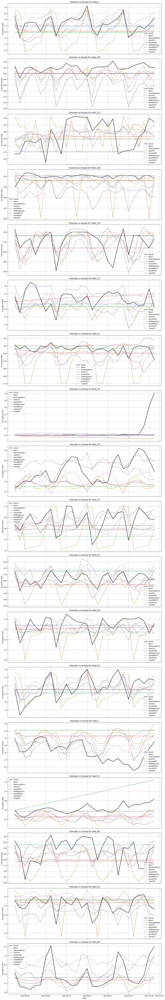

In [66]:
import matplotlib.pyplot as plt

models = ["Naive", "SeasonalNaive", "AutoETS", "AutoARIMA",
          "XGBRegressor", "AutoNBEATS", "AutoNHITS", "TimeGPT"]

## Combined forecasts from before (including actual)
plot_df = combo_fcst_toplot

## Plot forecasts vs. actuals for each series
num_hotels = plot_df['unique_id'].nunique()
fig, axes = plt.subplots(num_hotels, 1, figsize = (15, 5 * num_hotels), sharex=True)

if num_hotels == 1:
    axes = [axes]

for i, hotel_id in enumerate(plot_df['unique_id'].unique()):
    subset_df = plot_df[plot_df['unique_id'] == hotel_id]
    axes[i].plot(subset_df['ds'], subset_df['y'], label = f'Actual', color='black', linewidth = 2) # to make actual `y` value stand out
    for model_name in models:
        axes[i].plot(subset_df['ds'], subset_df[model_name], label = f'{model_name}', linestyle='--')

    axes[i].set_title(f'Forecasts vs Actuals for {hotel_id}')
    axes[i].set_ylabel('Occupancy Rate')
    axes[i].legend()
    axes[i].grid(True)

plt.xlabel('Date')
plt.tight_layout()
plt.show()

## Predicting the Next Four Weeks of Daily Room Demand

In [43]:
mlf.fit(df)
nn.fit(df)

+--------------------------------------------------------------------+
| Configuration for experiment     _train_tune_2025-12-05_17-58-26   |
+--------------------------------------------------------------------+
| Search algorithm                 BasicVariantGenerator             |
| Scheduler                        FIFOScheduler                     |
| Number of trials                 10                                |
+--------------------------------------------------------------------+

View detailed results here: /root/ray_results/_train_tune_2025-12-05_17-58-26
To visualize your results with TensorBoard, run: `tensorboard --logdir /tmp/ray/session_2025-12-05_17-16-31_021217_1224/artifacts/2025-12-05_17-58-26/_train_tune_2025-12-05_17-58-26/driver_artifacts`
(raylet) Warning: The actor ImplicitFunc is very large (19 MiB). Check that its definition is not implicitly capturing a large array or other object in scope. Tip: use ray.put() to put large objects in the Ray object store.


(_train_tune pid=18229) /usr/local/lib/python3.12/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=18229) Seed set to 16
(_train_tune pid=18229) GPU available: True (cuda), used: True
(_train_tune pid=18229) TPU available: False, using: 0 TPU cores
(_train_tune pid=18229) /usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Trig

(_train_tune pid=18229) ┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
(_train_tune pid=18229) ┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
(_train_tune pid=18229) ┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
(_train_tune pid=18229) │ 0 │ loss         │ MAE           │      0 │ train │     0 │
(_train_tune pid=18229) │ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
(_train_tune pid=18229) │ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
(_train_tune pid=18229) │ 3 │ blocks       │ ModuleList    │  2.7 M │ train │     0 │
(_train_tune pid=18229) └───┴──────────────┴───────────────┴────────┴───────┴───────┘
(_train_tune pid=18229) Trainable params: 2.7 M                                                         
(_train_tune pid=18229) Non-trainable params: 9.6 K                                                     
(_train_tune pid=18229) Total params: 2.7 M                                                           

(_train_tune pid=18229) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


(_train_tune pid=18229) Epoch 999/-2 ━━━━━━━━━━━━━━━━━ 1/1 0:00:00 • 0:00:00 0.00it/s v_num: 0.000      
(_train_tune pid=18229)                                                               train_loss_step:  
(_train_tune pid=18229)                                                               0.554             
(_train_tune pid=18229)                                                               train_loss_epoch: 
(_train_tune pid=18229)                                                               0.554 valid_loss: 
(_train_tune pid=18229)                                                               0.086             


(_train_tune pid=18229) `Trainer.fit` stopped: `max_steps=1000` reached.
(_train_tune pid=18430) /usr/local/lib/python3.12/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=18430) Seed set to 8
(_train_tune pid=18430) GPU available: True (cuda), used: True
(_train_tune pid=18430) TPU available: False, using: 0 TPU cores
(_train_tune pid=18430) /usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/ma

(_train_tune pid=18430) ┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
(_train_tune pid=18430) ┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
(_train_tune pid=18430) ┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
(_train_tune pid=18430) │ 0 │ loss         │ MAE           │      0 │ train │     0 │
(_train_tune pid=18430) │ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
(_train_tune pid=18430) │ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
(_train_tune pid=18430) │ 3 │ blocks       │ ModuleList    │  2.7 M │ train │     0 │
(_train_tune pid=18430) └───┴──────────────┴───────────────┴────────┴───────┴───────┘
(_train_tune pid=18430) Trainable params: 2.7 M                                                         
(_train_tune pid=18430) Non-trainable params: 8.0 K                                                     
(_train_tune pid=18430) Total params: 2.7 M                                                           

(_train_tune pid=18430) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


(_train_tune pid=18430) Epoch 499/-2 ━━━━━━━━━━━━━━━━━ 1/1 0:00:00 • 0:00:00 0.00it/s v_num: 0.000      
(_train_tune pid=18430)                                                               train_loss_step:  
(_train_tune pid=18430)                                                               0.005             
(_train_tune pid=18430)                                                               train_loss_epoch: 
(_train_tune pid=18430)                                                               0.005 valid_loss: 
(_train_tune pid=18430)                                                               0.105             


(_train_tune pid=18430) `Trainer.fit` stopped: `max_steps=500` reached.
(_train_tune pid=18601) /usr/local/lib/python3.12/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=18601) Seed set to 16
(_train_tune pid=18601) GPU available: True (cuda), used: True
(_train_tune pid=18601) TPU available: False, using: 0 TPU cores
(_train_tune pid=18601) /usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/ma

(_train_tune pid=18601) ┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
(_train_tune pid=18601) ┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
(_train_tune pid=18601) ┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
(_train_tune pid=18601) │ 0 │ loss         │ MAE           │      0 │ train │     0 │
(_train_tune pid=18601) │ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
(_train_tune pid=18601) │ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
(_train_tune pid=18601) │ 3 │ blocks       │ ModuleList    │  2.6 M │ train │     0 │
(_train_tune pid=18601) └───┴──────────────┴───────────────┴────────┴───────┴───────┘
(_train_tune pid=18601) Trainable params: 2.6 M                                                         
(_train_tune pid=18601) Non-trainable params: 4.8 K                                                     
(_train_tune pid=18601) Total params: 2.6 M                                                           

(_train_tune pid=18601) `Trainer.fit` stopped: `max_steps=1000` reached.


(_train_tune pid=18601) Epoch 999/-2 ━━━━━━━━━━━━━━━━━ 1/1 0:00:00 • 0:00:00 0.00it/s v_num: 0.000      
(_train_tune pid=18601)                                                               train_loss_step:  
(_train_tune pid=18601)                                                               0.599             
(_train_tune pid=18601)                                                               train_loss_epoch: 
(_train_tune pid=18601)                                                               0.599 valid_loss: 
(_train_tune pid=18601)                                                               0.093             


(_train_tune pid=18810) /usr/local/lib/python3.12/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=18810) Seed set to 3
(_train_tune pid=18810) GPU available: True (cuda), used: True
(_train_tune pid=18810) TPU available: False, using: 0 TPU cores
(_train_tune pid=18810) /usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Trigg

(_train_tune pid=18810) ┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
(_train_tune pid=18810) ┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
(_train_tune pid=18810) ┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
(_train_tune pid=18810) │ 0 │ loss         │ MAE           │      0 │ train │     0 │
(_train_tune pid=18810) │ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
(_train_tune pid=18810) │ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
(_train_tune pid=18810) │ 3 │ blocks       │ ModuleList    │  2.6 M │ train │     0 │
(_train_tune pid=18810) └───┴──────────────┴───────────────┴────────┴───────┴───────┘
(_train_tune pid=18810) Trainable params: 2.6 M                                                         
(_train_tune pid=18810) Non-trainable params: 4.8 K                                                     
(_train_tune pid=18810) Total params: 2.6 M                                                           

(_train_tune pid=18810) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


(_train_tune pid=18810) Epoch 499/-2 ━━━━━━━━━━━━━━━━━ 1/1 0:00:00 • 0:00:00 0.00it/s v_num: 0.000      
(_train_tune pid=18810)                                                               train_loss_step:  
(_train_tune pid=18810)                                                               0.332             
(_train_tune pid=18810)                                                               train_loss_epoch: 
(_train_tune pid=18810)                                                               0.332 valid_loss: 
(_train_tune pid=18810)                                                               0.112             


(_train_tune pid=18810) `Trainer.fit` stopped: `max_steps=500` reached.
(_train_tune pid=18985) /usr/local/lib/python3.12/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=18985) Seed set to 2
(_train_tune pid=18985) GPU available: True (cuda), used: True
(_train_tune pid=18985) TPU available: False, using: 0 TPU cores
(_train_tune pid=18985) /usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/mai

(_train_tune pid=18985) ┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
(_train_tune pid=18985) ┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
(_train_tune pid=18985) ┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
(_train_tune pid=18985) │ 0 │ loss         │ MAE           │      0 │ train │     0 │
(_train_tune pid=18985) │ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
(_train_tune pid=18985) │ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
(_train_tune pid=18985) │ 3 │ blocks       │ ModuleList    │  2.6 M │ train │     0 │
(_train_tune pid=18985) └───┴──────────────┴───────────────┴────────┴───────┴───────┘
(_train_tune pid=18985) Trainable params: 2.6 M                                                         
(_train_tune pid=18985) Non-trainable params: 4.8 K                                                     
(_train_tune pid=18985) Total params: 2.6 M                                                           

(_train_tune pid=18985) `Trainer.fit` stopped: `max_steps=500` reached.


(_train_tune pid=18985) Epoch 499/-2 ━━━━━━━━━━━━━━━━━ 1/1 0:00:00 • 0:00:00 0.00it/s v_num: 0.000      
(_train_tune pid=18985)                                                               train_loss_step:  
(_train_tune pid=18985)                                                               1.222             
(_train_tune pid=18985)                                                               train_loss_epoch: 
(_train_tune pid=18985)                                                               1.222 valid_loss: 
(_train_tune pid=18985)                                                               0.104             


(_train_tune pid=19163) /usr/local/lib/python3.12/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=19163) Seed set to 14
(_train_tune pid=19163) GPU available: True (cuda), used: True
(_train_tune pid=19163) TPU available: False, using: 0 TPU cores
(_train_tune pid=19163) /usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Trig

(_train_tune pid=19163) ┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
(_train_tune pid=19163) ┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
(_train_tune pid=19163) ┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
(_train_tune pid=19163) │ 0 │ loss         │ MAE           │      0 │ train │     0 │
(_train_tune pid=19163) │ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
(_train_tune pid=19163) │ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
(_train_tune pid=19163) │ 3 │ blocks       │ ModuleList    │  2.6 M │ train │     0 │
(_train_tune pid=19163) └───┴──────────────┴───────────────┴────────┴───────┴───────┘
(_train_tune pid=19163) Trainable params: 2.6 M                                                         
(_train_tune pid=19163) Non-trainable params: 4.8 K                                                     
(_train_tune pid=19163) Total params: 2.6 M                                                           

(_train_tune pid=19163) [2025-12-05 18:01:29,074 E 19163 19210] core_worker_process.cc:837: Failed to establish connection to the metrics exporter agent. Metrics will not be exported. Exporter agent status: RpcError: Running out of retries to initialize the metrics agent. rpc_code: 14
(_train_tune pid=19163) `Trainer.fit` stopped: `max_steps=1000` reached.


(_train_tune pid=19163) Epoch 999/-2 ━━━━━━━━━━━━━━━━━ 1/1 0:00:00 • 0:00:00 0.00it/s v_num: 0.000      
(_train_tune pid=19163)                                                               train_loss_step:  
(_train_tune pid=19163)                                                               5225317.500       
(_train_tune pid=19163)                                                               train_loss_epoch: 
(_train_tune pid=19163)                                                               5225317.500       
(_train_tune pid=19163)                                                               valid_loss:       
(_train_tune pid=19163)                                                               2502586.000       


(_train_tune pid=19370) /usr/local/lib/python3.12/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=19370) Seed set to 9
(_train_tune pid=19370) GPU available: True (cuda), used: True
(_train_tune pid=19370) TPU available: False, using: 0 TPU cores
(_train_tune pid=19370) /usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Trigg

(_train_tune pid=19370) ┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
(_train_tune pid=19370) ┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
(_train_tune pid=19370) ┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
(_train_tune pid=19370) │ 0 │ loss         │ MAE           │      0 │ train │     0 │
(_train_tune pid=19370) │ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
(_train_tune pid=19370) │ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
(_train_tune pid=19370) │ 3 │ blocks       │ ModuleList    │  2.6 M │ train │     0 │
(_train_tune pid=19370) └───┴──────────────┴───────────────┴────────┴───────┴───────┘
(_train_tune pid=19370) Trainable params: 2.6 M                                                         
(_train_tune pid=19370) Non-trainable params: 6.4 K                                                     
(_train_tune pid=19370) Total params: 2.6 M                                                           

(_train_tune pid=19370) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(_train_tune pid=19370) `Trainer.fit` stopped: `max_steps=500` reached.


(_train_tune pid=19370) Epoch 499/-2 ━━━━━━━━━━━━━━━━━ 1/1 0:00:00 • 0:00:00 0.00it/s v_num: 0.000      
(_train_tune pid=19370)                                                               train_loss_step:  
(_train_tune pid=19370)                                                               0.294             
(_train_tune pid=19370)                                                               train_loss_epoch: 
(_train_tune pid=19370)                                                               0.294 valid_loss: 
(_train_tune pid=19370)                                                               0.114             


(_train_tune pid=19545) /usr/local/lib/python3.12/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=19545) Seed set to 12
(_train_tune pid=19545) GPU available: True (cuda), used: True
(_train_tune pid=19545) TPU available: False, using: 0 TPU cores
(_train_tune pid=19545) /usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Trig

(_train_tune pid=19545) ┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
(_train_tune pid=19545) ┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
(_train_tune pid=19545) ┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
(_train_tune pid=19545) │ 0 │ loss         │ MAE           │      0 │ train │     0 │
(_train_tune pid=19545) │ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
(_train_tune pid=19545) │ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
(_train_tune pid=19545) │ 3 │ blocks       │ ModuleList    │  2.7 M │ train │     0 │
(_train_tune pid=19545) └───┴──────────────┴───────────────┴────────┴───────┴───────┘
(_train_tune pid=19545) Trainable params: 2.7 M                                                         
(_train_tune pid=19545) Non-trainable params: 8.0 K                                                     
(_train_tune pid=19545) Total params: 2.7 M                                                           

(_train_tune pid=19545) `Trainer.fit` stopped: `max_steps=500` reached.


(_train_tune pid=19545) Epoch 499/-2 ━━━━━━━━━━━━━━━━━ 1/1 0:00:00 • 0:00:00 0.00it/s v_num: 0.000      
(_train_tune pid=19545)                                                               train_loss_step:  
(_train_tune pid=19545)                                                               0.127             
(_train_tune pid=19545)                                                               train_loss_epoch: 
(_train_tune pid=19545)                                                               0.127 valid_loss: 
(_train_tune pid=19545)                                                               0.108             


(_train_tune pid=19717) /usr/local/lib/python3.12/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=19717) Seed set to 7
(_train_tune pid=19717) GPU available: True (cuda), used: True
(_train_tune pid=19717) TPU available: False, using: 0 TPU cores
(_train_tune pid=19717) /usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Trigg

(_train_tune pid=19717) ┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
(_train_tune pid=19717) ┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
(_train_tune pid=19717) ┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
(_train_tune pid=19717) │ 0 │ loss         │ MAE           │      0 │ train │     0 │
(_train_tune pid=19717) │ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
(_train_tune pid=19717) │ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
(_train_tune pid=19717) │ 3 │ blocks       │ ModuleList    │  2.5 M │ train │     0 │
(_train_tune pid=19717) └───┴──────────────┴───────────────┴────────┴───────┴───────┘
(_train_tune pid=19717) Trainable params: 2.5 M                                                         
(_train_tune pid=19717) Non-trainable params: 3.2 K                                                     
(_train_tune pid=19717) Total params: 2.5 M                                                           

(_train_tune pid=19717) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


(_train_tune pid=19717) Epoch 999/-2 ━━━━━━━━━━━━━━━━━ 1/1 0:00:00 • 0:00:00 0.00it/s v_num: 0.000      
(_train_tune pid=19717)                                                               train_loss_step:  
(_train_tune pid=19717)                                                               0.947             
(_train_tune pid=19717)                                                               train_loss_epoch: 
(_train_tune pid=19717)                                                               0.947 valid_loss: 
(_train_tune pid=19717)                                                               0.107             


(_train_tune pid=19717) `Trainer.fit` stopped: `max_steps=1000` reached.
(_train_tune pid=19923) /usr/local/lib/python3.12/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=19923) Seed set to 5
(_train_tune pid=19923) GPU available: True (cuda), used: True
(_train_tune pid=19923) TPU available: False, using: 0 TPU cores
(_train_tune pid=19923) /usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/ma

(_train_tune pid=19923) ┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
(_train_tune pid=19923) ┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
(_train_tune pid=19923) ┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
(_train_tune pid=19923) │ 0 │ loss         │ MAE           │      0 │ train │     0 │
(_train_tune pid=19923) │ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
(_train_tune pid=19923) │ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
(_train_tune pid=19923) │ 3 │ blocks       │ ModuleList    │  2.6 M │ train │     0 │
(_train_tune pid=19923) └───┴──────────────┴───────────────┴────────┴───────┴───────┘
(_train_tune pid=19923) Trainable params: 2.6 M                                                         
(_train_tune pid=19923) Non-trainable params: 4.8 K                                                     
(_train_tune pid=19923) Total params: 2.6 M                                                           

(_train_tune pid=19923) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(_train_tune pid=19923) `Trainer.fit` stopped: `max_steps=500` reached.
2025-12-05 18:03:22,974	INFO tune.py:1009 -- Wrote the latest version of all result files and experiment state to '/root/ray_results/_train_tune_2025-12-05_17-58-26' in 0.0065s.
INFO:lightning_fabric.utilities.seed:Seed set to 16
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



(_train_tune pid=19923) Epoch 499/-2 ━━━━━━━━━━━━━━━━━ 1/1 0:00:00 • 0:00:00 0.00it/s v_num: 0.000      
(_train_tune pid=19923)                                                               train_loss_step:  
(_train_tune pid=19923)                                                               2.268             
(_train_tune pid=19923)                                                               train_loss_epoch: 
(_train_tune pid=19923)                                                               2.268 valid_loss: 
(_train_tune pid=19923)                                                               0.144             


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ eval  │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ blocks       │ ModuleList    │  2.7 M │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 2.7 M                                                                                            
Non-trainable params: 9.6 K                                                                                        
Total params: 2.7 M                                                                                                
Total estimated model params size (MB): 10                                                                         
Modules in train mode: 30                                                                                          
Modules in eval mode: 1                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.


+--------------------------------------------------------------------+
| Configuration for experiment     _train_tune_2025-12-05_18-03-48   |
+--------------------------------------------------------------------+
| Search algorithm                 BasicVariantGenerator             |
| Scheduler                        FIFOScheduler                     |
| Number of trials                 10                                |
+--------------------------------------------------------------------+

View detailed results here: /root/ray_results/_train_tune_2025-12-05_18-03-48
To visualize your results with TensorBoard, run: `tensorboard --logdir /tmp/ray/session_2025-12-05_17-16-31_021217_1224/artifacts/2025-12-05_18-03-48/_train_tune_2025-12-05_18-03-48/driver_artifacts`
(raylet) Warning: The actor ImplicitFunc is very large (19 MiB). Check that its definition is not implicitly capturing a large array or other object in scope. Tip: use ray.put() to put large objects in the Ray object store.


(_train_tune pid=20219) /usr/local/lib/python3.12/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=20219) Seed set to 6
(_train_tune pid=20219) GPU available: True (cuda), used: True
(_train_tune pid=20219) TPU available: False, using: 0 TPU cores
(_train_tune pid=20219) /usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Trigg

(_train_tune pid=20219) ┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
(_train_tune pid=20219) ┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
(_train_tune pid=20219) ┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
(_train_tune pid=20219) │ 0 │ loss         │ MAE           │      0 │ train │     0 │
(_train_tune pid=20219) │ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
(_train_tune pid=20219) │ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
(_train_tune pid=20219) │ 3 │ blocks       │ ModuleList    │  2.7 M │ train │     0 │
(_train_tune pid=20219) └───┴──────────────┴───────────────┴────────┴───────┴───────┘
(_train_tune pid=20219) Trainable params: 2.7 M                                                         
(_train_tune pid=20219) Non-trainable params: 0                                                         
(_train_tune pid=20219) Total params: 2.7 M                                                           

(_train_tune pid=20219) [2025-12-05 18:04:24,298 E 20219 20263] core_worker_process.cc:837: Failed to establish connection to the metrics exporter agent. Metrics will not be exported. Exporter agent status: RpcError: Running out of retries to initialize the metrics agent. rpc_code: 14
(_train_tune pid=20219) `Trainer.fit` stopped: `max_steps=1400.0` reached.


(_train_tune pid=20219) Epoch 1399/-2 ━━━━━━━━━━━━━━━━━ 1/1 0:00:00 • 0:00:00 0.00it/s v_num: 0.000     
(_train_tune pid=20219)                                                                train_loss_step: 
(_train_tune pid=20219)                                                                45660760.000     
(_train_tune pid=20219)                                                                train_loss_epoch:
(_train_tune pid=20219)                                                                45660760.000     
(_train_tune pid=20219)                                                                valid_loss:      
(_train_tune pid=20219)                                                                36527364.000     


(_train_tune pid=20442) /usr/local/lib/python3.12/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=20442) Seed set to 15
(_train_tune pid=20442) GPU available: True (cuda), used: True
(_train_tune pid=20442) TPU available: False, using: 0 TPU cores
(_train_tune pid=20442) /usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Trig

(_train_tune pid=20442) ┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
(_train_tune pid=20442) ┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
(_train_tune pid=20442) ┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
(_train_tune pid=20442) │ 0 │ loss         │ MAE           │      0 │ train │     0 │
(_train_tune pid=20442) │ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
(_train_tune pid=20442) │ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
(_train_tune pid=20442) │ 3 │ blocks       │ ModuleList    │  2.8 M │ train │     0 │
(_train_tune pid=20442) └───┴──────────────┴───────────────┴────────┴───────┴───────┘
(_train_tune pid=20442) Trainable params: 2.8 M                                                         
(_train_tune pid=20442) Non-trainable params: 0                                                         
(_train_tune pid=20442) Total params: 2.8 M                                                           

(_train_tune pid=20442) `Trainer.fit` stopped: `max_steps=500.0` reached.


(_train_tune pid=20442) Epoch 499/-2 ━━━━━━━━━━━━━━━━━ 1/1 0:00:00 • 0:00:00 0.00it/s v_num: 0.000      
(_train_tune pid=20442)                                                               train_loss_step:  
(_train_tune pid=20442)                                                               0.023             
(_train_tune pid=20442)                                                               train_loss_epoch: 
(_train_tune pid=20442)                                                               0.023 valid_loss: 
(_train_tune pid=20442)                                                               0.109             


(_train_tune pid=20620) /usr/local/lib/python3.12/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=20620) Seed set to 3
(_train_tune pid=20620) GPU available: True (cuda), used: True
(_train_tune pid=20620) TPU available: False, using: 0 TPU cores
(_train_tune pid=20620) /usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Trigg

(_train_tune pid=20620) ┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
(_train_tune pid=20620) ┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
(_train_tune pid=20620) ┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
(_train_tune pid=20620) │ 0 │ loss         │ MAE           │      0 │ train │     0 │
(_train_tune pid=20620) │ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
(_train_tune pid=20620) │ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
(_train_tune pid=20620) │ 3 │ blocks       │ ModuleList    │  2.5 M │ train │     0 │
(_train_tune pid=20620) └───┴──────────────┴───────────────┴────────┴───────┴───────┘
(_train_tune pid=20620) Trainable params: 2.5 M                                                         
(_train_tune pid=20620) Non-trainable params: 0                                                         
(_train_tune pid=20620) Total params: 2.5 M                                                           

(_train_tune pid=20620) `Trainer.fit` stopped: `max_steps=1000.0` reached.


(_train_tune pid=20620) Epoch 999/-2 ━━━━━━━━━━━━━━━━━ 1/1 0:00:00 • 0:00:00 0.00it/s v_num: 0.000      
(_train_tune pid=20620)                                                               train_loss_step:  
(_train_tune pid=20620)                                                               0.526             
(_train_tune pid=20620)                                                               train_loss_epoch: 
(_train_tune pid=20620)                                                               0.526 valid_loss: 
(_train_tune pid=20620)                                                               0.491             


(_train_tune pid=20826) /usr/local/lib/python3.12/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=20826) Seed set to 10
(_train_tune pid=20826) GPU available: True (cuda), used: True
(_train_tune pid=20826) TPU available: False, using: 0 TPU cores
(_train_tune pid=20826) /usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Trig

(_train_tune pid=20826) ┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
(_train_tune pid=20826) ┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
(_train_tune pid=20826) ┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
(_train_tune pid=20826) │ 0 │ loss         │ MAE           │      0 │ train │     0 │
(_train_tune pid=20826) │ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
(_train_tune pid=20826) │ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
(_train_tune pid=20826) │ 3 │ blocks       │ ModuleList    │  2.4 M │ train │     0 │
(_train_tune pid=20826) └───┴──────────────┴───────────────┴────────┴───────┴───────┘
(_train_tune pid=20826) Trainable params: 2.4 M                                                         
(_train_tune pid=20826) Non-trainable params: 0                                                         
(_train_tune pid=20826) Total params: 2.4 M                                                           

(_train_tune pid=20826) `Trainer.fit` stopped: `max_steps=800.0` reached.


(_train_tune pid=20826) Epoch 799/-2 ━━━━━━━━━━━━━━━━━ 1/1 0:00:00 • 0:00:00 0.00it/s v_num: 0.000      
(_train_tune pid=20826)                                                               train_loss_step:  
(_train_tune pid=20826)                                                               0.028             
(_train_tune pid=20826)                                                               train_loss_epoch: 
(_train_tune pid=20826)                                                               0.028 valid_loss: 
(_train_tune pid=20826)                                                               0.117             


(_train_tune pid=21016) /usr/local/lib/python3.12/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=21016) Seed set to 4
(_train_tune pid=21016) GPU available: True (cuda), used: True
(_train_tune pid=21016) TPU available: False, using: 0 TPU cores
(_train_tune pid=21016) /usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Trigg

(_train_tune pid=21016) ┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
(_train_tune pid=21016) ┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
(_train_tune pid=21016) ┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
(_train_tune pid=21016) │ 0 │ loss         │ MAE           │      0 │ train │     0 │
(_train_tune pid=21016) │ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
(_train_tune pid=21016) │ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
(_train_tune pid=21016) │ 3 │ blocks       │ ModuleList    │  2.5 M │ train │     0 │
(_train_tune pid=21016) └───┴──────────────┴───────────────┴────────┴───────┴───────┘
(_train_tune pid=21016) Trainable params: 2.5 M                                                         
(_train_tune pid=21016) Non-trainable params: 0                                                         
(_train_tune pid=21016) Total params: 2.5 M                                                           

(_train_tune pid=21016) `Trainer.fit` stopped: `max_steps=800.0` reached.


(_train_tune pid=21016) Epoch 799/-2 ━━━━━━━━━━━━━━━━━ 1/1 0:00:00 • 0:00:00 0.00it/s v_num: 0.000      
(_train_tune pid=21016)                                                               train_loss_step:  
(_train_tune pid=21016)                                                               0.116             
(_train_tune pid=21016)                                                               train_loss_epoch: 
(_train_tune pid=21016)                                                               0.116 valid_loss: 
(_train_tune pid=21016)                                                               0.102             


(_train_tune pid=21206) /usr/local/lib/python3.12/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=21206) Seed set to 12
(_train_tune pid=21206) GPU available: True (cuda), used: True
(_train_tune pid=21206) TPU available: False, using: 0 TPU cores
(_train_tune pid=21206) /usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Trig

(_train_tune pid=21206) ┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
(_train_tune pid=21206) ┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
(_train_tune pid=21206) ┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
(_train_tune pid=21206) │ 0 │ loss         │ MAE           │      0 │ train │     0 │
(_train_tune pid=21206) │ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
(_train_tune pid=21206) │ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
(_train_tune pid=21206) │ 3 │ blocks       │ ModuleList    │  2.6 M │ train │     0 │
(_train_tune pid=21206) └───┴──────────────┴───────────────┴────────┴───────┴───────┘
(_train_tune pid=21206) Trainable params: 2.6 M                                                         
(_train_tune pid=21206) Non-trainable params: 0                                                         
(_train_tune pid=21206) Total params: 2.6 M                                                           

(_train_tune pid=21206) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(_train_tune pid=21206) [2025-12-05 18:07:04,154 E 21206 21254] core_worker_process.cc:837: Failed to establish connection to the metrics exporter agent. Metrics will not be exported. Exporter agent status: RpcError: Running out of retries to initialize the metrics agent. rpc_code: 14
(_train_tune pid=21206) `Trainer.fit` stopped: `max_steps=1300.0` reached.


(_train_tune pid=21206) Epoch 1299/-2 ━━━━━━━━━━━━━━━━━ 1/1 0:00:00 • 0:00:00 0.00it/s v_num: 0.000     
(_train_tune pid=21206)                                                                train_loss_step: 
(_train_tune pid=21206)                                                                0.076            
(_train_tune pid=21206)                                                                train_loss_epoch:
(_train_tune pid=21206)                                                                0.076 valid_loss:
(_train_tune pid=21206)                                                                0.114            


(_train_tune pid=21431) /usr/local/lib/python3.12/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=21431) Seed set to 13
(_train_tune pid=21431) GPU available: True (cuda), used: True
(_train_tune pid=21431) TPU available: False, using: 0 TPU cores
(_train_tune pid=21431) /usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Trig

(_train_tune pid=21431) ┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
(_train_tune pid=21431) ┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
(_train_tune pid=21431) ┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
(_train_tune pid=21431) │ 0 │ loss         │ MAE           │      0 │ train │     0 │
(_train_tune pid=21431) │ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
(_train_tune pid=21431) │ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
(_train_tune pid=21431) │ 3 │ blocks       │ ModuleList    │  2.6 M │ train │     0 │
(_train_tune pid=21431) └───┴──────────────┴───────────────┴────────┴───────┴───────┘
(_train_tune pid=21431) Trainable params: 2.6 M                                                         
(_train_tune pid=21431) Non-trainable params: 0                                                         
(_train_tune pid=21431) Total params: 2.6 M                                                           

(_train_tune pid=21431) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


(_train_tune pid=21431) Epoch 599/-2 ━━━━━━━━━━━━━━━━━ 1/1 0:00:00 • 0:00:00 0.00it/s v_num: 0.000      
(_train_tune pid=21431)                                                               train_loss_step:  
(_train_tune pid=21431)                                                               0.012             
(_train_tune pid=21431)                                                               train_loss_epoch: 
(_train_tune pid=21431)                                                               0.012 valid_loss: 
(_train_tune pid=21431)                                                               0.107             


(_train_tune pid=21431) `Trainer.fit` stopped: `max_steps=600.0` reached.
(_train_tune pid=21611) /usr/local/lib/python3.12/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=21611) Seed set to 10
(_train_tune pid=21611) GPU available: True (cuda), used: True
(_train_tune pid=21611) TPU available: False, using: 0 TPU cores
(_train_tune pid=21611) /usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/

(_train_tune pid=21611) ┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
(_train_tune pid=21611) ┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
(_train_tune pid=21611) ┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
(_train_tune pid=21611) │ 0 │ loss         │ MAE           │      0 │ train │     0 │
(_train_tune pid=21611) │ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
(_train_tune pid=21611) │ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
(_train_tune pid=21611) │ 3 │ blocks       │ ModuleList    │  2.8 M │ train │     0 │
(_train_tune pid=21611) └───┴──────────────┴───────────────┴────────┴───────┴───────┘
(_train_tune pid=21611) Trainable params: 2.8 M                                                         
(_train_tune pid=21611) Non-trainable params: 0                                                         
(_train_tune pid=21611) Total params: 2.8 M                                                           

(_train_tune pid=21611) [2025-12-05 18:08:10,108 E 21611 21656] core_worker_process.cc:837: Failed to establish connection to the metrics exporter agent. Metrics will not be exported. Exporter agent status: RpcError: Running out of retries to initialize the metrics agent. rpc_code: 14
(_train_tune pid=21611) `Trainer.fit` stopped: `max_steps=1000.0` reached.


(_train_tune pid=21611) Epoch 999/-2 ━━━━━━━━━━━━━━━━━ 1/1 0:00:00 • 0:00:00 0.00it/s v_num: 0.000      
(_train_tune pid=21611)                                                               train_loss_step:  
(_train_tune pid=21611)                                                               0.021             
(_train_tune pid=21611)                                                               train_loss_epoch: 
(_train_tune pid=21611)                                                               0.021 valid_loss: 
(_train_tune pid=21611)                                                               0.106             


(_train_tune pid=21813) /usr/local/lib/python3.12/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=21813) Seed set to 4
(_train_tune pid=21813) GPU available: True (cuda), used: True
(_train_tune pid=21813) TPU available: False, using: 0 TPU cores
(_train_tune pid=21813) /usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Trigg

(_train_tune pid=21813) ┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
(_train_tune pid=21813) ┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
(_train_tune pid=21813) ┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
(_train_tune pid=21813) │ 0 │ loss         │ MAE           │      0 │ train │     0 │
(_train_tune pid=21813) │ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
(_train_tune pid=21813) │ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
(_train_tune pid=21813) │ 3 │ blocks       │ ModuleList    │  2.6 M │ train │     0 │
(_train_tune pid=21813) └───┴──────────────┴───────────────┴────────┴───────┴───────┘
(_train_tune pid=21813) Trainable params: 2.6 M                                                         
(_train_tune pid=21813) Non-trainable params: 0                                                         
(_train_tune pid=21813) Total params: 2.6 M                                                           

(_train_tune pid=21813) [2025-12-05 18:08:44,125 E 21813 21863] core_worker_process.cc:837: Failed to establish connection to the metrics exporter agent. Metrics will not be exported. Exporter agent status: RpcError: Running out of retries to initialize the metrics agent. rpc_code: 14
(_train_tune pid=21813) `Trainer.fit` stopped: `max_steps=1300.0` reached.


(_train_tune pid=21813) Epoch 1299/-2 ━━━━━━━━━━━━━━━━━ 1/1 0:00:00 • 0:00:00 0.00it/s v_num: 0.000     
(_train_tune pid=21813)                                                                train_loss_step: 
(_train_tune pid=21813)                                                                13.821           
(_train_tune pid=21813)                                                                train_loss_epoch:
(_train_tune pid=21813)                                                                13.821           
(_train_tune pid=21813)                                                                valid_loss: 5.149


(_train_tune pid=22038) /usr/local/lib/python3.12/dist-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=22038) Seed set to 17
(_train_tune pid=22038) GPU available: True (cuda), used: True
(_train_tune pid=22038) TPU available: False, using: 0 TPU cores
(_train_tune pid=22038) /usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Trig

(_train_tune pid=22038) ┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
(_train_tune pid=22038) ┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
(_train_tune pid=22038) ┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
(_train_tune pid=22038) │ 0 │ loss         │ MAE           │      0 │ train │     0 │
(_train_tune pid=22038) │ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
(_train_tune pid=22038) │ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
(_train_tune pid=22038) │ 3 │ blocks       │ ModuleList    │  2.5 M │ train │     0 │
(_train_tune pid=22038) └───┴──────────────┴───────────────┴────────┴───────┴───────┘
(_train_tune pid=22038) Trainable params: 2.5 M                                                         
(_train_tune pid=22038) Non-trainable params: 0                                                         
(_train_tune pid=22038) Total params: 2.5 M                                                           

(_train_tune pid=22038) LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
(_train_tune pid=22038) [2025-12-05 18:09:22,157 E 22038 22087] core_worker_process.cc:837: Failed to establish connection to the metrics exporter agent. Metrics will not be exported. Exporter agent status: RpcError: Running out of retries to initialize the metrics agent. rpc_code: 14
(_train_tune pid=22038) `Trainer.fit` stopped: `max_steps=1400.0` reached.
2025-12-05 18:09:27,923	INFO tune.py:1009 -- Wrote the latest version of all result files and experiment state to '/root/ray_results/_train_tune_2025-12-05_18-03-48' in 0.0064s.
INFO:lightning_fabric.utilities.seed:Seed set to 17
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



(_train_tune pid=22038) Epoch 1399/-2 ━━━━━━━━━━━━━━━━━ 1/1 0:00:00 • 0:00:00 0.00it/s v_num: 0.000     
(_train_tune pid=22038)                                                                train_loss_step: 
(_train_tune pid=22038)                                                                0.086            
(_train_tune pid=22038)                                                                train_loss_epoch:
(_train_tune pid=22038)                                                                0.086 valid_loss:
(_train_tune pid=22038)                                                                0.087            


┏━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name         ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss         │ MAE           │      0 │ eval  │     0 │
│ 1 │ padder_train │ ConstantPad1d │      0 │ train │     0 │
│ 2 │ scaler       │ TemporalNorm  │      0 │ train │     0 │
│ 3 │ blocks       │ ModuleList    │  2.5 M │ train │     0 │
└───┴──────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 2.5 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 2.5 M                                                                                                
Total estimated model params size (MB): 10                                                                         
Modules in train mode: 33                                                                                          
Modules in eval mode: 1                                                                                            
Total FLOPs: 0

Output()

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1400.0` reached.


In [45]:
## Forecasting four weeks into the future by day
future_horizon = 28
frequency = "D"

future_forecasts = sf.forecast(df=df, h=future_horizon)
mlf_forecast = mlf.predict(h=future_horizon) # MLF uses predict instead of forecast
nn_forecast = nn.predict(h=future_horizon)
timegpt_forecast = nixtla_client.forecast(df=df, h=future_horizon, freq=frequency)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Output()

In [47]:
## Merging the forecasts
combo_future_forecasts = (
    future_forecasts.merge(mlf_forecast, on=["unique_id", "ds"], how="right")
                     .merge(nn_forecast, on=["unique_id", "ds"], how="right")
                     .merge(timegpt_forecast, on=["unique_id", "ds"], how="right")
)

combo_future_forecasts

,unique_id,ds,Naive,SeasonalNaive,AutoETS,AutoARIMA,XGBRegressor,AutoNBEATS,AutoNHITS,TimeGPT
0,hotel_0,2023-07-01,0.82716,0.950617,0.769958,0.783528,0.853047,0.935976,0.882977,0.827481
1,hotel_0,2023-07-02,0.82716,0.506173,0.769958,0.743502,0.693964,0.519477,0.600755,0.624427
2,hotel_0,2023-07-03,0.82716,0.580247,0.769958,0.731073,0.601993,0.561455,0.605605,0.635184
3,hotel_0,2023-07-04,0.82716,0.691358,0.769958,0.731073,0.638841,0.730571,0.662335,0.732741
4,hotel_0,2023-07-05,0.82716,0.654321,0.769958,0.731073,0.688200,0.709084,0.716122,0.741329
...,...,...,...,...,...,...,...,...,...,...
499,hotel_98,2023-07-24,0.50000,0.104839,0.499991,0.271103,0.179822,0.102153,0.198019,0.215449
500,hotel_98,2023-07-25,0.50000,0.096774,0.499991,0.271103,0.165198,0.100023,0.190897,0.207385
501,hotel_98,2023-07-26,0.50000,0.185484,0.499991,0.271103,0.099161,0.098335,0.188838,0.218032
502,hotel_98,2023-07-27,0.50000,0.411290,0.499991,0.271103,0.082855,0.116744,0.235583,0.280791


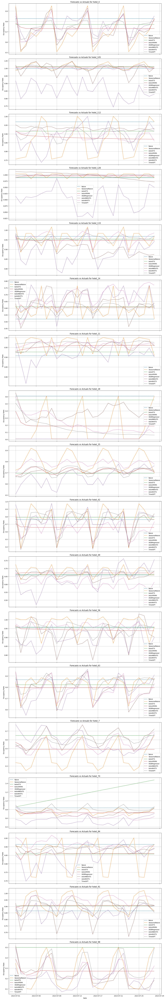

In [67]:
## plotting the forecast

models = ["Naive", "SeasonalNaive", "AutoETS", "AutoARIMA",
          "XGBRegressor", "AutoNBEATS", "AutoNHITS", "TimeGPT"]

## Combined forecasts from before (including actual)
plot_df = combo_future_forecasts

## Plot forecasts vs. actuals for each series
num_hotels = plot_df['unique_id'].nunique()
fig, axes = plt.subplots(num_hotels, 1, figsize = (15, 5 * num_hotels), sharex=True)

if num_hotels == 1:
    axes = [axes]

for i, hotel_id in enumerate(plot_df['unique_id'].unique()):
    subset_df = plot_df[plot_df['unique_id'] == hotel_id]
    for model_name in models:
        axes[i].plot(subset_df['ds'], subset_df[model_name], label = f'{model_name}', linestyle='--')

    axes[i].set_title(f'Forecasts vs Actuals for {hotel_id}')
    axes[i].set_ylabel('Forecasted Room Demand')
    axes[i].legend()
    axes[i].grid(True)

plt.xlabel('Date')
plt.tight_layout()
plt.show()

Naive, AutoETS, and AutoARIMA flattened out in the predictions of several of the hotels. Outside of these three, the other models tended to follow similar patterns across the 28 days for hotels 0, 42, 63, and 98.